# Swing Counties des élections US 2016 #

Dans ce projet Pyhton pour le Datascientist, j'ai éssayé d'appliquer les différentes techniques de modélisation et de visualtion de données vues en cours et complétées par des recherches personnelles pour essayer de déterminer les "Swing Counties" lors des élections US de 2016.
J'avais essayé de travailler sur des données des éléctions de 2020 plus récentes et plus intéressantes, mais j'ai eu beaucoup de mal à trouver une base de données aussi 'propre' que celle des élections de 2016. En effet, il y avait certains counties où le compte des voix n'est pas fini ou mal renseigné.

J'ai donc choisi de reprendre la base de données vue en cours:
https://public.opendatasoft.com/explore/dataset/usa-2016-presidential-election-by-county/download/?format=geojson&timezone=Europe/Berlin&lang=fr

### Remarque : si vous éxecutez le code, mettez l'url au dessus dans la commande read_csv car ce n'est pas exactement la même (je me trouve actuellement au Maroc et j'ai du changer la Timezone dans l'URL :) )

Je commence par importer les données et tous les packages dont je me sers dans ce notebook

In [527]:

import pandas as pd 
import geopandas as gpd
df = pd.read_csv('https://public.opendatasoft.com/explore/dataset/usa-2016-presidential-election-by-county/download/?format=csv&timezone=Africa/Lagos&lang=fr&use_labels_for_header=true&csv_separator=%3B', sep = ';') 

In [528]:
import pandas as pd 
import numpy as np
import plotly
import cufflinks as cf
import chart_studio.plotly as py
import seaborn as sns
import plotly.express as px
import random
import plotly.graph_objects as go
import json
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from plotly.offline import download_plotlyjs , init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

In [529]:
df

,State,ST,Fips,County,Precincts,Votes,Democrats 08 (Votes),Democrats 12 (Votes),Republicans 08 (Votes),Republicans 12 (Votes),...,total08,total12,other08,other12,Other12 Frac,Other08 Frac,Rep12 Frac2,Rep08 Frac2,Dem12 Frac2,Dem08 Frac2
0,Georgia,GA,13057,"Cherokee County, Georgia",42.0,110825.0,22350.0,19841.0,70279.0,76514.0,...,93772.0,98220.0,1143.0,1865.0,0.018988,0.012189,0.794084,0.758715,0.205916,0.241285
1,Michigan,MI,26121,"Muskegon County, Michigan",67.0,77114.0,53821.0,44436.0,29145.0,30884.0,...,84271.0,76163.0,1305.0,843.0,0.011068,0.015486,0.410037,0.351288,0.589963,0.648712
2,Georgia,GA,13145,"Harris County, Georgia",12.0,16392.0,4184.0,4145.0,10648.0,11197.0,...,14908.0,15488.0,76.0,146.0,0.009427,0.005098,0.729827,0.717907,0.270173,0.282093
3,Pennsylvania,PA,42065,"Jefferson County, Pennsylvania",37.0,18551.0,6447.0,4787.0,12057.0,13048.0,...,18855.0,18097.0,351.0,262.0,0.014478,0.018616,0.731595,0.651589,0.268405,0.348411
4,Rhode Island,RI,44007,"Providence County, Rhode Island",291.0,242179.0,167442.0,159520.0,81010.0,75785.0,...,253630.0,239786.0,5178.0,4481.0,0.018687,0.020416,0.322071,0.326059,0.677929,0.673941
5,Nebraska,NE,31099,"Kearney County, Nebraska",11.0,3242.0,876.0,773.0,2224.0,2349.0,...,3150.0,3180.0,50.0,58.0,0.018239,0.015873,0.752402,0.717419,0.247598,0.282581
6,Illinois,IL,17047,"Edwards County, Illinois",12.0,3312.0,1140.0,754.0,2137.0,2405.0,...,3350.0,3228.0,73.0,69.0,0.021375,0.021791,0.761317,0.652121,0.238683,0.347879
7,Texas,TX,48439,"Tarrant County, Texas",695.0,662832.0,274880.0,253071.0,348420.0,348920.0,...,628553.0,610890.0,5253.0,8899.0,0.014567,0.008357,0.579610,0.558992,0.420390,0.441008
8,Texas,TX,48471,"Walker County, Texas",17.0,19683.0,7334.0,6252.0,11623.0,12140.0,...,19146.0,18685.0,189.0,293.0,0.015681,0.009872,0.660070,0.613124,0.339930,0.386876
9,Virginia,VA,51007,"Amelia County, Virginia",6.0,7035.0,2488.0,2490.0,3970.0,4331.0,...,6529.0,6915.0,71.0,94.0,0.013594,0.010875,0.634951,0.614741,0.365049,0.385259


In [530]:
df.columns

Index(['State', 'ST', 'Fips', 'County', 'Precincts', 'Votes',
       'Democrats 08 (Votes)', 'Democrats 12 (Votes)',
       'Republicans 08 (Votes)', 'Republicans 12 (Votes)',
       ...
       'total08', 'total12', 'other08', 'other12', 'Other12 Frac',
       'Other08 Frac', 'Rep12 Frac2', 'Rep08 Frac2', 'Dem12 Frac2',
       'Dem08 Frac2'],
      dtype='object', length=159)

# Clustring des différents county aux US pour repérer les "Swing States".

On commence d'abord par standardiser les variables du DataFrame.

## 1. Standardisation des variables:
### a. Détermination des variables numériques:

In [531]:
#Détermination des colonnes non numériques

num_col = []
non_num_col = []
columns=df.columns.values
for i in range(len(df.dtypes)):
    typ=df.dtypes[i]
    if typ == 'float64':
        num_col.append(columns[i])
    elif typ == 'int64':
        num_col.append(columns[i])
    else :
        non_num_col.append(columns[i])
        
print(num_col)

['Fips', 'Precincts', 'Votes', 'Democrats 08 (Votes)', 'Democrats 12 (Votes)', 'Republicans 08 (Votes)', 'Republicans 12 (Votes)', 'Republicans 2016', 'Democrats 2016', 'Green 2016', 'Libertarians 2016', 'Republicans 2012', 'Republicans 2008', 'Democrats 2012', 'Democrats 2008', 'Less Than High School Diploma', 'At Least High School Diploma', "At Least Bachelors's Degree", 'Graduate Degree', 'School Enrollment', 'Median Earnings 2010', 'White (Not Latino) Population', 'African American Population', 'Native American Population', 'Asian American Population', 'Other Race or Races', 'Latino Population', 'Children Under 6 Living in Poverty', 'Adults 65 and Older Living in Poverty', 'Total Population', 'Preschool.Enrollment.Ratio.enrolled.ages.3.and.4', 'Poverty.Rate.below.federal.poverty.threshold', 'Gini.Coefficient', 'Child.Poverty.living.in.families.below.the.poverty.line', 'Management.professional.and.related.occupations', 'Service.occupations', 'Sales.and.office.occupations', 'Farming.

In [532]:
print(non_num_col)

['State', 'ST', 'County', 'Temp Bins', 'Lon Bins', 'Precip Bins', 'Elevation Bins', 'Geo Shape', 'Name 16', 'Name Prev']


In [631]:
#Standardisation des colonnes numériques
df_num = df[num_col[2:]]
import sklearn.preprocessing as proc
dfstd = pd.DataFrame(proc.StandardScaler().fit_transform(df_num))
dfstd.columns = num_col[2:]

In [632]:
dfstd

,Votes,Democrats 08 (Votes),Democrats 12 (Votes),Republicans 08 (Votes),Republicans 12 (Votes),Republicans 2016,Democrats 2016,Green 2016,Libertarians 2016,Republicans 2012,...,total08,total12,other08,other12,Other12 Frac,Other08 Frac,Rep12 Frac2,Rep08 Frac2,Dem12 Frac2,Dem08 Frac2
0,0.608965,0.000747,-0.017480,1.138648,1.272754,0.584513,-0.583288,NaN,0.894683,1.233921,...,0.430949,0.485647,0.296156,0.496340,0.056722,-0.500409,1.239140,1.288819,-1.239140,-1.288819
1,0.311704,0.408783,0.313885,0.221667,0.253666,-1.086856,1.033365,0.575388,0.624178,-1.291823,...,0.351730,0.297180,0.383414,0.053943,-0.814138,-0.114858,-1.315149,-1.609275,1.315149,1.609275
2,-0.223739,-0.234784,-0.228951,-0.190677,-0.186018,0.587606,-0.442255,NaN,-0.560385,0.854834,...,-0.226618,-0.221260,-0.278560,-0.247770,-0.994665,-1.329751,0.811763,0.998547,-0.811763,-0.998547
3,-0.204701,-0.205443,-0.220301,-0.159267,-0.144678,0.943319,-0.858288,-0.468346,-0.648846,0.841693,...,-0.193708,-0.198967,-0.130437,-0.197556,-0.439257,0.251206,0.823526,0.526813,-0.823526,-0.526813
4,1.767237,1.881931,1.864399,1.377869,1.256473,-1.684891,1.748204,0.662595,-0.249680,-1.896678,...,1.763844,1.695264,2.469519,1.628738,0.023680,0.461701,-1.900207,-1.788737,1.900207,1.788737
5,-0.339695,-0.277673,-0.274381,-0.378470,-0.383627,0.902221,-0.960253,-0.112395,0.903043,0.961220,...,-0.324656,-0.326426,-0.292564,-0.285863,-0.025639,-0.069566,0.961913,0.995076,-0.961913,-0.995076
6,-0.339078,-0.274251,-0.274637,-0.380409,-0.382376,1.295865,-1.216158,-0.791110,-0.273591,1.004256,...,-0.322989,-0.326016,-0.280176,-0.281101,0.319255,0.622568,1.021204,0.530597,-1.021204,-0.530597
7,5.476529,3.274913,3.124802,7.339110,7.356595,-0.733558,0.768152,-0.092538,0.276362,-0.171539,...,4.889949,4.866177,2.509916,3.541175,-0.429390,-0.948557,-0.187324,-0.131841,0.187324,0.131841
8,-0.194719,-0.193943,-0.200563,-0.168942,-0.164957,0.116432,-0.049877,-0.087710,-0.212719,0.359651,...,-0.191282,-0.193943,-0.217695,-0.184137,-0.306919,-0.771464,0.347811,0.253209,-0.347811,-0.253209
9,-0.306249,-0.256773,-0.251248,-0.339547,-0.339361,0.208551,-0.072947,-1.109056,-0.875454,0.201418,...,-0.296482,-0.294512,-0.281253,-0.270279,-0.536453,-0.654154,0.180747,0.264711,-0.180747,-0.264711


On réalise un pairplot de variables choisies aléatoirement pour comparer le résultat avant et après standardisation.

### Avant standardisation : 
1. Avec Seaborn:


In [537]:
#Choix aléatoire des volonnes de la liste des colonnes numériques
sampling = random.choices(num_col, k=5)
print(sampling)

['At Least High School Diploma', 'Other', 'Votes16 Silvar', 'Adult.smoking', 'Sexually.transmitted.infections']


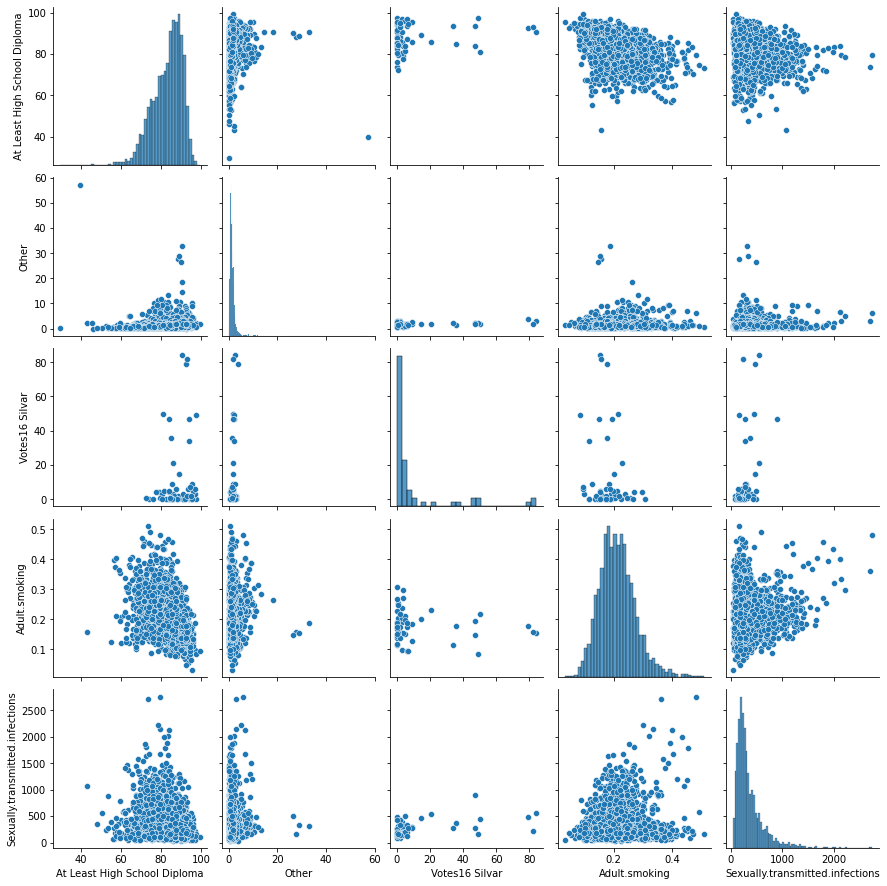

In [538]:
#Avant standardisation
import seaborn as sns
sns.pairplot(df_num[sampling])

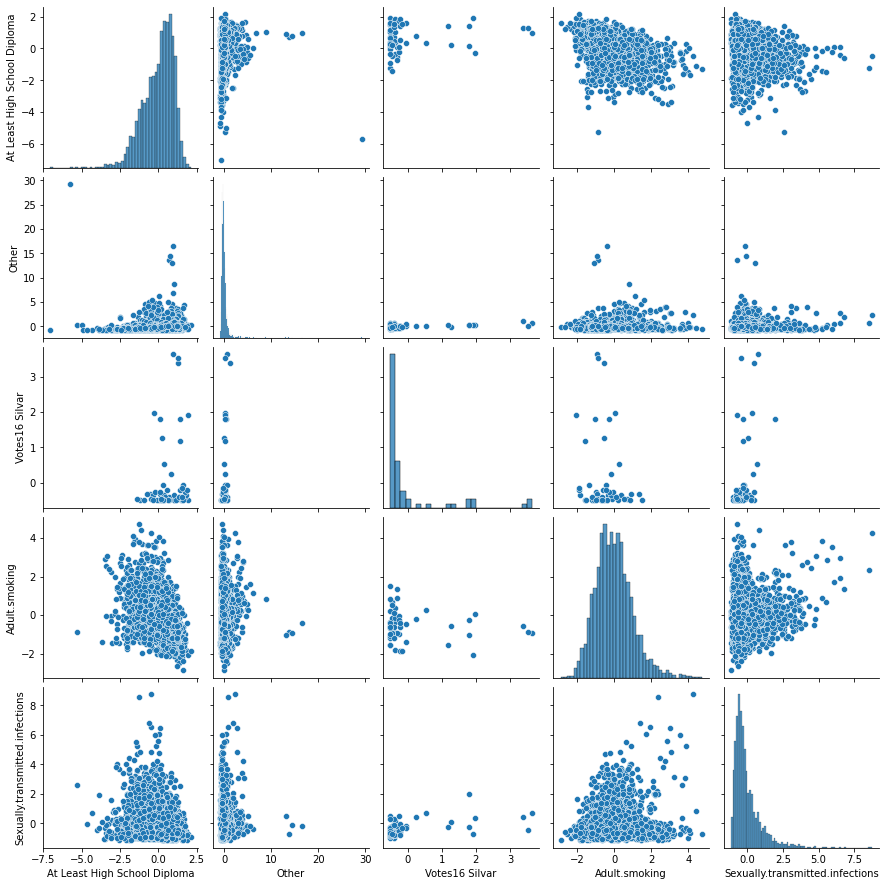

In [539]:
#Après strandardisation
sns.pairplot(dfstd[sampling])

Nous remarquons alors que la forme reste la même mais que les valeurs se resserent et deviennent centrées en 0

2. Avec Plotly:



In [540]:
#Avant standardisation:
fig = px.scatter_matrix(df_num[sampling])
fig.show()

In [541]:
#Après standardisation:
fig = px.scatter_matrix(dfstd[sampling])
fig.show()

# Détermination du nombre optimal de clusters:

## Elbow method:

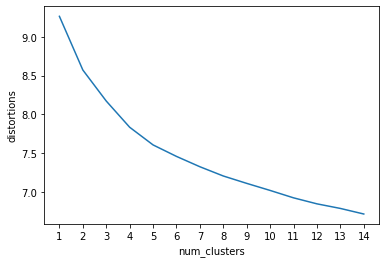

In [542]:

import matplotlib.pyplot as plt
from scipy.cluster.vq import kmeans, vq
distortions = []
num_clusters = range(1, 15)

dfstd = np.nan_to_num(dfstd)
# Create a list of distortions from the kmeans function
for i in num_clusters:
    cluster_centers, distortion = kmeans(dfstd,i)
    distortions.append(distortion)

# Create a data frame with two lists - num_clusters, distortions
elbow_plot = pd.DataFrame({'num_clusters': num_clusters, 'distortions': distortions})

# Creat a line plot of num_clusters and distortions
sns.lineplot(x='num_clusters', y='distortions', data = elbow_plot)
plt.xticks(num_clusters)
plt.show()

Nous n'avons pas de point d'inflexion très marqué. Mais je pense que nous aurons très vraisemblablement une valeur pertinante de k entre 2 et 5.

# Clustering hiérarchique ascendant

### Méthode ward

In [441]:
 # Import the fcluster and linkage functions
from scipy.cluster.hierarchy import fcluster, linkage

# Use the linkage() function
distance_matrix = linkage(dfstd, method = 'ward', metric = 'euclidean')

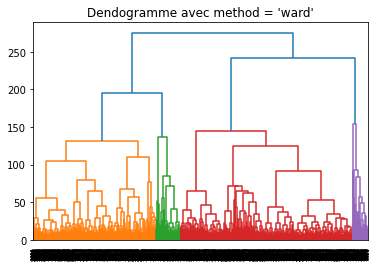

In [442]:
# Dendogramme
# Pour faire les dendogrammes

# Import the dendrogram function
from scipy.cluster.hierarchy import dendrogram

# Create a dendrogram
dn = dendrogram(distance_matrix)

# Display the dendogram
plt.title("Dendogramme avec method = 'ward'")
plt.show()

### Méthode complète

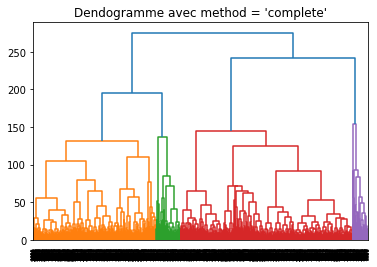

In [443]:
# Use the linkage() function
distance_matrix_complete = linkage(dfstd, method = 'complete', metric = 'euclidean')

dn = dendrogram(distance_matrix)

# Display the dendogram
plt.title("Dendogramme avec method = 'complete'")
plt.show()

### Méthode average

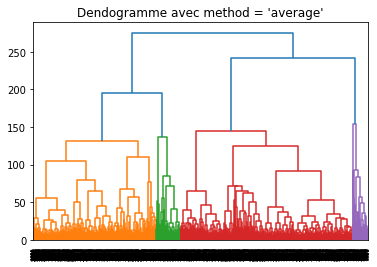

In [444]:
# Use the linkage() function
distance_matrix_complete = linkage(dfstd, method = 'average', metric = 'euclidean')

dn = dendrogram(distance_matrix)

# Display the dendogram
plt.title("Dendogramme avec method = 'average'")
plt.show()

### Méthode single

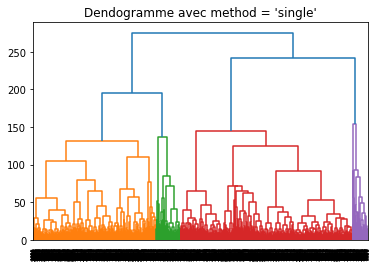

In [445]:
# Use the linkage() function
distance_matrix_complete = linkage(dfstd, method = 'single', metric = 'euclidean')

dn = dendrogram(distance_matrix)

# Display the dendogram
plt.title("Dendogramme avec method = 'single'")
plt.show()

On tombe en utlisant différentes methodes de clustering hiérarchique sur un même dendogramme.

Première intuition que j'ai eue en regardant ces dendogrammes et que je cherche à vérifier dans la section suivante:
 On retient un nombre de clusters K=4 qui donne 4 groupes assez visibles:
 - Des counties profondément républicains ou profondément démocrates (ce sont les grandes branches)




 - Des counties assez sensibles qui seraient éventuellement les 'Swing States' qu'on cherche à mettre en évidence

# - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

# Mise à plat sur une carte  : 


Je choisis pour des raisons de praticité de représenter les County par leur FIPS ('Federal Information Processing Standards')

In [543]:
df['Fips']

0       13057
1       26121
2       13145
3       42065
4       44007
        ...  
3138    47131
3139    26099
3140    54007
3141    37121
3142    24019
Name: Fips, Length: 3143, dtype: int64

On représente dans un premier temps le résultat des élections sur une carte 

In [546]:
#Nouvelle variable qui donne le candidat vainqueur dans chaque county 
df['Republican Winner'] = np.where(df['Rep16 Frac2']>df['Dem16 Frac2'], 'Republican', 'Democrat')

#Carte 
import plotly.figure_factory as ff
colorscale = ['rgb(0,0,255)','rgb(255, 0, 0)']
fig = ff.create_choropleth(fips=df['Fips'], 
                           values=df['Republican Winner'],
                          mapbox_style="carto-positron",
                          colorscale = colorscale)
fig.layout.template = None
fig.show()

Cette carte bien que très claire ne renseigne pas sur le poids démographique de chaque county puisque des county bien que très grands géographiquement sont très peu peuplés et vice-versa. Je fais alors le Bubble Map suivant.

In [547]:
dfmap = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_us_cities.csv')
dfmap.head()
df['Republican Winner2'] = np.where(df['Rep16 Frac2']>df['Dem16 Frac2'], 'rgb(0,0,255)','rgb(255, 0, 0)')
dfmap['text'] = dfmap['name'] + '<br>Population ' + (dfmap['pop']/1e6).astype(str)+' million'
limits = [(0,2),(3,10),(11,20),(21,50),(50,3000)]
colors = ["royalblue","crimson","lightseagreen","orange","lightgrey"]
cities = []
scale = 5000

fig = go.Figure()

for i in range(len(limits)):
    lim = limits[i]
    df_sub = dfmap[lim[0]:lim[1]]
    fig.add_trace(go.Scattergeo(
    locationmode = 'USA-states',
    lon = df_sub['lon'],
    lat = df_sub['lat'],
    marker = dict(
    size = df_sub['pop']/scale,
    color = df['Republican Winner2'],
    line_color='rgb(40,40,40)',
    line_width=0.5,
    sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])))

    
fig.update_layout(
        title_text = '2016 US democrat counties by population size<br>(Click legend to toggle traces)',
        showlegend = True,
        geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)',
        )
    )

fig.show()

In [548]:
dfmap = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_us_cities.csv')
dfmap.head()


dfmap['text'] = dfmap['name'] + '<br>Population ' + (dfmap['pop']/1e6).astype(str)+' million'
limits = [(0,2),(3,10),(11,20),(21,50),(50,3000)]
colors = ["royalblue","crimson","lightseagreen","orange","lightgrey"]
cities = []
scale = 5000

fig = go.Figure()

for i in range(len(limits)):
        if df['Republican Winner'][i] == 'Republican':
            lim = limits[i]
            dfmap_sub = dfmap[lim[0]:lim[1]]
            fig.add_trace(go.Scattergeo(
            locationmode = 'USA-states',
            lon = dfmap_sub['lon'],
            lat = dfmap_sub['lat'],
            marker = dict(size = dfmap_sub['pop']/scale,
            color = 'rgb(255, 0, 0)',
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'),
            name = '{0} - {1}'.format(lim[0],lim[1])))
            
        lim = limits[i]
        df_sub = dfmap[lim[0]:lim[1]]
        fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = df_sub['lon'],
        lat = df_sub['lat'],
        marker = dict(
        size = df_sub['pop']/scale,
            color = 'rgb(0, 0, 255)',
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])))

    
fig.update_layout(
        title_text = '2016 US democrat counties by population size<br>(Click legend to toggle traces)',
        showlegend = True,
        geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)',
        )
    )

fig.show()

J'essaye désormais de représenter les différents clusters sur la carte pour voir quels sont leur propriétés.

In [487]:
df

,State,ST,Fips,County,Precincts,Votes,Democrats 08 (Votes),Democrats 12 (Votes),Republicans 08 (Votes),Republicans 12 (Votes),...,total12,other08,other12,Other12 Frac,Other08 Frac,Rep12 Frac2,Rep08 Frac2,Dem12 Frac2,Dem08 Frac2,Republican Winner
0,Georgia,GA,13231,"Pike County, Georgia",8.0,8675.0,1575.0,1356.0,6547.0,6668.0,...,8109.0,81.0,85.0,0.010482,0.009874,0.831007,0.806082,0.168993,0.193918,Republican
1,Utah,UT,49051,"Wasatch County, Utah",38.0,12120.0,2892.0,2191.0,5430.0,7220.0,...,9589.0,209.0,178.0,0.018563,0.024499,0.767187,0.652487,0.232813,0.347513,Republican
2,Washington,WA,53021,"Franklin County, Washington",15.0,20584.0,7361.0,8398.0,12037.0,13748.0,...,22643.0,298.0,497.0,0.021949,0.015130,0.620789,0.620528,0.379211,0.379472,Republican
3,Nebraska,NE,31119,"Madison County, Nebraska",22.0,13956.0,4142.0,3485.0,9655.0,10062.0,...,13885.0,248.0,338.0,0.024343,0.017658,0.742747,0.699790,0.257253,0.300210,Republican
4,Florida,FL,12045,"Gulf County, Florida",9.0,7279.0,2149.0,2014.0,4980.0,4995.0,...,7108.0,76.0,99.0,0.013928,0.010548,0.712655,0.698555,0.287345,0.301445,Republican
5,Georgia,GA,13267,"Tattnall County, Georgia",8.0,6879.0,1932.0,1897.0,4730.0,4706.0,...,6667.0,52.0,64.0,0.009600,0.007745,0.712706,0.709997,0.287294,0.290003,Republican
6,Wisconsin,WI,55083,"Oconto County, Wisconsin",28.0,19924.0,9927.0,8865.0,8755.0,10741.0,...,19859.0,286.0,253.0,0.012740,0.015078,0.547842,0.468633,0.452158,0.531367,Republican
7,Alabama,AL,1059,"Franklin County, Alabama",26.0,11955.0,3469.0,3171.0,8048.0,7567.0,...,10881.0,176.0,143.0,0.013142,0.015052,0.704694,0.698793,0.295306,0.301207,Republican
8,Washington,WA,53015,"Cowlitz County, Washington",30.0,45485.0,24597.0,22726.0,19554.0,20746.0,...,44620.0,1078.0,1148.0,0.025728,0.023834,0.477227,0.442889,0.522773,0.557111,Republican
9,Missouri,MO,29061,"Daviess County, Missouri",7.0,3689.0,1400.0,1125.0,2263.0,2290.0,...,3521.0,123.0,106.0,0.030105,0.032488,0.670571,0.617800,0.329429,0.382200,Republican


In [554]:
dfstd = pd.DataFrame(proc.StandardScaler().fit_transform(df_num))
dfstd.columns = num_col[2:]
dfstd.insert(0, 'Fips', df['Fips'])
dfstd.insert(1, 'County', df['County'])
dfstd

,Fips,County,Votes,Democrats 08 (Votes),Democrats 12 (Votes),Republicans 08 (Votes),Republicans 12 (Votes),Republicans 2016,Democrats 2016,Green 2016,...,total08,total12,other08,other12,Other12 Frac,Other08 Frac,Rep12 Frac2,Rep08 Frac2,Dem12 Frac2,Dem08 Frac2
0,13057,"Cherokee County, Georgia",0.608965,0.000747,-0.017480,1.138648,1.272754,0.584513,-0.583288,NaN,...,0.430949,0.485647,0.296156,0.496340,0.056722,-0.500409,1.239140,1.288819,-1.239140,-1.288819
1,26121,"Muskegon County, Michigan",0.311704,0.408783,0.313885,0.221667,0.253666,-1.086856,1.033365,0.575388,...,0.351730,0.297180,0.383414,0.053943,-0.814138,-0.114858,-1.315149,-1.609275,1.315149,1.609275
2,13145,"Harris County, Georgia",-0.223739,-0.234784,-0.228951,-0.190677,-0.186018,0.587606,-0.442255,NaN,...,-0.226618,-0.221260,-0.278560,-0.247770,-0.994665,-1.329751,0.811763,0.998547,-0.811763,-0.998547
3,42065,"Jefferson County, Pennsylvania",-0.204701,-0.205443,-0.220301,-0.159267,-0.144678,0.943319,-0.858288,-0.468346,...,-0.193708,-0.198967,-0.130437,-0.197556,-0.439257,0.251206,0.823526,0.526813,-0.823526,-0.526813
4,44007,"Providence County, Rhode Island",1.767237,1.881931,1.864399,1.377869,1.256473,-1.684891,1.748204,0.662595,...,1.763844,1.695264,2.469519,1.628738,0.023680,0.461701,-1.900207,-1.788737,1.900207,1.788737
5,31099,"Kearney County, Nebraska",-0.339695,-0.277673,-0.274381,-0.378470,-0.383627,0.902221,-0.960253,-0.112395,...,-0.324656,-0.326426,-0.292564,-0.285863,-0.025639,-0.069566,0.961913,0.995076,-0.961913,-0.995076
6,17047,"Edwards County, Illinois",-0.339078,-0.274251,-0.274637,-0.380409,-0.382376,1.295865,-1.216158,-0.791110,...,-0.322989,-0.326016,-0.280176,-0.281101,0.319255,0.622568,1.021204,0.530597,-1.021204,-0.530597
7,48439,"Tarrant County, Texas",5.476529,3.274913,3.124802,7.339110,7.356595,-0.733558,0.768152,-0.092538,...,4.889949,4.866177,2.509916,3.541175,-0.429390,-0.948557,-0.187324,-0.131841,0.187324,0.131841
8,48471,"Walker County, Texas",-0.194719,-0.193943,-0.200563,-0.168942,-0.164957,0.116432,-0.049877,-0.087710,...,-0.191282,-0.193943,-0.217695,-0.184137,-0.306919,-0.771464,0.347811,0.253209,-0.347811,-0.253209
9,51007,"Amelia County, Virginia",-0.306249,-0.256773,-0.251248,-0.339547,-0.339361,0.208551,-0.072947,-1.109056,...,-0.296482,-0.294512,-0.281253,-0.270279,-0.536453,-0.654154,0.180747,0.264711,-0.180747,-0.264711


In [647]:
dfstd = pd.DataFrame(proc.StandardScaler().fit_transform(df_num))
dfstd = np.nan_to_num(dfstd)
dfstd = pd.DataFrame(dfstd)
dfstd.columns = num_col[2:]
dfcluster= dfstd

from scipy.cluster.vq import kmeans, vq

cluster_centers, distortion = kmeans(dfstd,4)
cluster_labels = vq(dfstd,cluster_centers)[0]
dfcluster['cluster_labels'], distortion_list = vq(dfstd,cluster_centers) 


In [648]:
dfcluster

,Votes,Democrats 08 (Votes),Democrats 12 (Votes),Republicans 08 (Votes),Republicans 12 (Votes),Republicans 2016,Democrats 2016,Green 2016,Libertarians 2016,Republicans 2012,...,total12,other08,other12,Other12 Frac,Other08 Frac,Rep12 Frac2,Rep08 Frac2,Dem12 Frac2,Dem08 Frac2,cluster_labels
0,0.608965,0.000747,-0.017480,1.138648,1.272754,0.584513,-0.583288,0.000000,0.894683,1.233921,...,0.485647,0.296156,0.496340,0.056722,-0.500409,1.239140,1.288819,-1.239140,-1.288819,2
1,0.311704,0.408783,0.313885,0.221667,0.253666,-1.086856,1.033365,0.575388,0.624178,-1.291823,...,0.297180,0.383414,0.053943,-0.814138,-0.114858,-1.315149,-1.609275,1.315149,1.609275,2
2,-0.223739,-0.234784,-0.228951,-0.190677,-0.186018,0.587606,-0.442255,0.000000,-0.560385,0.854834,...,-0.221260,-0.278560,-0.247770,-0.994665,-1.329751,0.811763,0.998547,-0.811763,-0.998547,1
3,-0.204701,-0.205443,-0.220301,-0.159267,-0.144678,0.943319,-0.858288,-0.468346,-0.648846,0.841693,...,-0.198967,-0.130437,-0.197556,-0.439257,0.251206,0.823526,0.526813,-0.823526,-0.526813,2
4,1.767237,1.881931,1.864399,1.377869,1.256473,-1.684891,1.748204,0.662595,-0.249680,-1.896678,...,1.695264,2.469519,1.628738,0.023680,0.461701,-1.900207,-1.788737,1.900207,1.788737,3
5,-0.339695,-0.277673,-0.274381,-0.378470,-0.383627,0.902221,-0.960253,-0.112395,0.903043,0.961220,...,-0.326426,-0.292564,-0.285863,-0.025639,-0.069566,0.961913,0.995076,-0.961913,-0.995076,2
6,-0.339078,-0.274251,-0.274637,-0.380409,-0.382376,1.295865,-1.216158,-0.791110,-0.273591,1.004256,...,-0.326016,-0.280176,-0.281101,0.319255,0.622568,1.021204,0.530597,-1.021204,-0.530597,1
7,5.476529,3.274913,3.124802,7.339110,7.356595,-0.733558,0.768152,-0.092538,0.276362,-0.171539,...,4.866177,2.509916,3.541175,-0.429390,-0.948557,-0.187324,-0.131841,0.187324,0.131841,3
8,-0.194719,-0.193943,-0.200563,-0.168942,-0.164957,0.116432,-0.049877,-0.087710,-0.212719,0.359651,...,-0.193943,-0.217695,-0.184137,-0.306919,-0.771464,0.347811,0.253209,-0.347811,-0.253209,0
9,-0.306249,-0.256773,-0.251248,-0.339547,-0.339361,0.208551,-0.072947,-1.109056,-0.875454,0.201418,...,-0.294512,-0.281253,-0.270279,-0.536453,-0.654154,0.180747,0.264711,-0.180747,-0.264711,1


In [649]:
colorscale = ['rgb(126,0,0)','rgb(0,0,126)','rgb(0,0,255)','rgb(255, 0, 0)']
fig = ff.create_choropleth(fips=df['Fips'], 
                           values=dfcluster['cluster_labels'],
                          mapbox_style="carto-positron"
                        )
fig.layout.template = None
fig.show()

Pour mieux comprendre à quel type de counties appartient chaque cluster, il convient d'abord de voir les résultats des élections au sein de chaque cluster. Mais avant je trace la répartition des votes pour en voir la distribution.

In [650]:

group_labels = ['Democrat score', 'Republican score']
fig = ff.create_distplot([dfstd['Dem16 Frac2'],dfstd['Rep16 Frac2']],group_labels)
fig.update_layout(title_text='Democrat and Republican Score')
fig.show()

Nous pouvons alors faire le constat suivant: 
Il y a une asymétrie dans la répartition des votes malgré la standardisation des données. En effet, le score des Républicains ne dépasse pas 2 mais est centré en 1. Cela veut dire que les Républicains remportent beaucoup de victoires mais avec un score relativement serré.
En revanche, les démocrates ont une répartition plus étalée, le camp démocrate réalise des performances très différentes d'un county à un autre. En effet, les Démocrates remportent des victoires éclatantes dans certains counties (grandes villes) et essuient beaucoup de petites défaites dans les autres petits counties.

In [653]:
for i in range (0,4):
    cluster = dfcluster[dfcluster['cluster_labels'] == i]
    fig = px.scatter_matrix(cluster[['Rep16 Frac2' , 'Dem16 Frac2' , 'Rep12 Frac2', 'Dem12 Frac2' , 'Rep08 Frac2', 'Dem08 Frac2']])

    fig.show()

En regardant les différents scetterplot des différents clusters, nous pouvons conclure que:
- Le cluster 0 est un cluster de counties républicains puisqu'il concentre tous les counties où les républicains ont un score positif. Il compte aussi des counties démocrates (peut-être overfitting??).
- Le cluster 1 est est cluster démocrate qui a toujours eu des résultats très stables et très similaires dans le temps. 
- Le cluster 2 est un cluster démocrate qui enregistre un fort recul de votes démocrates et qui donc tourne au rouge.
- Le cluster 3 est similaire au cluster 2 et enregistre un recul des votes démocrates mais moins marqués.

Pour essayer de mieux comprendre les spécificités des clusters, on réalise un LASSO pour déterminer quelles sont les variables les plus pertinantes qu'ont ces counties en commun.

In [654]:
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso


In [672]:
#On crée le dataframe sur lequel on réalise le lasso
# NB: Il s'agit des counties du cluster 1
dfstd = pd.DataFrame(proc.StandardScaler().fit_transform(df_num))
dfstd = dfstd.fillna(0)
dfstd.columns = num_col[2:]
dfstd2 = pd.DataFrame(proc.StandardScaler().fit_transform(df_num))
dfstd2 = dfstd.fillna(0)
dfstd2.columns = num_col[2:]
cluster_centers, distortion = kmeans(dfstd,4)
cluster_labels = vq(dfstd,cluster_centers)[0]
dfstd['cluster_labels'], distortion_list = vq(dfstd,cluster_centers)[0] ,vq(dfstd,cluster_centers)[1]



#On supprime d'abord les variables résultats de 2016
del(dfstd['Republicans 2016'])
del(dfstd['Democrats 2016'])
del(dfstd['Rep16 Frac2'])
del(dfstd['Dem16 Frac2'])
dfstd['Rep16 Frac2'] = dfstd2['Rep16 Frac2']


df_cluster1 = dfstd[dfstd['cluster_labels']==2]
#On retire la colonne cluster_labels
del(df_cluster1['cluster_labels'])
df_cluster1

,Votes,Democrats 08 (Votes),Democrats 12 (Votes),Republicans 08 (Votes),Republicans 12 (Votes),Green 2016,Libertarians 2016,Republicans 2012,Republicans 2008,Democrats 2012,...,total12,other08,other12,Other12 Frac,Other08 Frac,Rep12 Frac2,Rep08 Frac2,Dem12 Frac2,Dem08 Frac2,Rep16 Frac2
2,-0.223739,-0.234784,-0.228951,-0.190677,-0.186018,0.000000,-0.560385,0.854834,1.056350,-0.793446,...,-0.221260,-0.278560,-0.247770,-0.994665,-1.329751,0.811763,0.998547,-0.811763,-0.998547,0.484169
6,-0.339078,-0.274251,-0.274637,-0.380409,-0.382376,-0.791110,-0.273591,1.004256,0.505055,-1.023605,...,-0.326016,-0.280176,-0.281101,0.319255,0.622568,1.021204,0.530597,-1.021204,-0.530597,1.232028
9,-0.306249,-0.256773,-0.251248,-0.339547,-0.339361,-1.109056,-0.875454,0.201418,0.289453,-0.168382,...,-0.294512,-0.281253,-0.270279,-0.536453,-0.654154,0.180747,0.264711,-0.180747,-0.264711,0.118823
11,-0.348557,-0.285595,-0.281509,-0.379027,-0.390037,0.000000,0.095483,2.012814,2.343315,-1.887377,...,-0.333894,-0.319496,-0.310969,-2.031242,-1.925973,1.904934,2.240109,-1.904934,-2.240109,1.563090
14,0.179100,0.004935,0.026684,0.435943,0.445423,-0.549668,-0.828011,0.180749,0.415766,-0.134710,...,0.187511,-0.035639,0.008924,-0.748046,-0.931177,0.151956,0.379744,-0.151956,-0.379744,-0.059875
23,-0.140842,-0.153477,-0.142697,-0.084944,-0.097085,0.000000,-0.671097,-0.083930,0.168619,0.141145,...,-0.131559,-0.221465,-0.198422,-0.931026,-1.108178,-0.118050,0.127763,0.118050,-0.127763,-0.294869
32,-0.114450,-0.181185,-0.188761,0.021971,-0.012061,0.000000,1.149610,0.882533,1.012616,-0.757410,...,-0.130465,-0.319496,-0.310969,-2.031242,-1.925973,0.793249,0.929437,-0.793249,-0.929437,0.743958
33,-0.271030,-0.249953,-0.253606,-0.259026,-0.255052,-0.720566,-0.835073,1.161309,1.008865,-1.119404,...,-0.263444,-0.255937,-0.254696,-0.676384,-0.637889,1.131182,0.981801,-1.131182,-0.981801,0.841738
37,0.336244,0.096173,0.085601,0.467576,0.534312,-0.544724,-0.667789,0.077526,0.008388,-0.002007,...,0.257030,0.060237,-0.085009,-1.228035,-0.757944,0.031241,-0.018837,-0.031241,0.018837,-0.255273
41,-0.183168,-0.216593,-0.220274,-0.074667,-0.089849,-0.394468,-0.799995,1.050975,1.157053,-1.032374,...,-0.177435,-0.141748,-0.170285,-0.297829,-0.153053,1.039021,1.151430,-1.039021,-1.151430,1.014072


In [673]:
#subdivision
from sklearn.model_selection import train_test_split
bbTrain, bbTest = train_test_split(df_cluster1,train_size = 200,random_state=69780)
#vérifications
print(bbTrain.shape) 
print(bbTest.shape) 


(200, 144)
(910, 144)


In [657]:
#matrice des explicatives
XTrain = bbTrain.iloc[:,:143]
print(XTrain.shape)
#à laquelle est ajoutée (accolée) la constante 1
import statsmodels.api as sm 
X1Train = sm.add_constant(XTrain)
#vérification
print(X1Train.head())

(200, 143)
      const     Votes  Democrats 08 (Votes)  Democrats 12 (Votes)  \
611     1.0 -0.255193             -0.234071             -0.228601   
2482    1.0 -0.112959             -0.101615             -0.088509   
1854    1.0 -0.227557             -0.221377             -0.229651   
77      1.0 -0.318638             -0.264526             -0.262310   
2846    1.0 -0.297554             -0.246621             -0.250346   

      Republicans 08 (Votes)  Republicans 12 (Votes)  Green 2016  \
611                -0.253788               -0.248955   -0.724514   
2482               -0.054448               -0.100904   -0.294795   
1854               -0.185617               -0.191892   -0.508870   
77                 -0.354371               -0.358032   -0.884298   
2846               -0.320308               -0.323974   -0.291892   

      Libertarians 2016  Republicans 2012  Republicans 2008  ...   total08  \
611           -0.763359          0.400689          0.487107  ... -0.248347   
2482     

In [658]:
#vecteur cible
yTrain = bbTrain.iloc[:,143]
print(yTrain)

611     0.735698
2482   -0.151022
1854    1.040827
77      0.444084
2846    0.749189
          ...   
879     1.152782
829     0.341565
1200   -0.804802
1138    0.668613
2232    0.579905
Name: Rep16 Frac2, Length: 200, dtype: float64


In [659]:
#matrice des descripteurs pour échantillon test
XTest = bbTest.iloc[:,:143]
X1Test = sm.add_constant(XTest)
#appliquer le modèle
ypReg = reg.predict(resReg.params,X1Test) 
print(ypReg)

[ 1.12029689e+00  5.55949958e-01  2.72471487e+07  7.64908232e-01
 -7.63882420e-03 -6.47673776e-02  1.21776317e+00  4.40191491e-01
  3.53608171e-02  1.35540716e+00  1.28088111e+00 -6.15633692e-01
  5.74585662e-01  8.25222236e-01 -7.51642783e-01 -1.26128860e+08
  3.67197002e-01  1.92688858e+06 -4.60239633e-01  1.13201060e+00
  1.33814580e+00  4.88473218e-01  5.02651199e-01  7.64701197e-01
 -7.44965166e+07  3.82925472e-01 -1.80279395e-01  2.48321731e+07
  6.66639596e-01 -6.08176573e+07  3.20045582e-01  8.49937511e-01
  1.12635229e+00  8.11657689e-01  1.02558706e+00  6.51756995e-01
  5.83485166e-01  1.22206265e+00 -6.25396025e-01  6.86343915e-01
  1.62635105e+00  3.79804387e+06  7.93425545e-01  1.62477366e+00
  8.81496279e-01 -1.08610430e+00  4.91714345e-02  5.70716506e-01
  1.63603279e-01  1.29388185e+06  3.23112023e+07  1.83850578e+07
  3.86943198e-01  3.34257566e-01  1.26346647e+00  6.44101891e-01
  6.71069437e-01 -8.44477459e-03  7.75322996e-01  1.92688840e+06
  5.84477582e-01  1.16277

In [660]:
#centrer et réduire les données d'apprentissage
from sklearn.preprocessing import StandardScaler 
sc = StandardScaler()
ZTrain =sc.fit_transform(bbTrain)

from sklearn.linear_model import Lasso
regLasso1 = Lasso(fit_intercept=False,normalize=False)
print(regLasso1)

#apprentissage
regLasso1.fit(ZTrain[:,:143],ZTrain[:,143])
#les coefficients
print(regLasso1.coef_)



Lasso(alpha=1.0, copy_X=True, fit_intercept=False, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)
[-0. -0. -0. -0. -0. -0. -0.  0.  0. -0. -0.  0. -0. -0. -0. -0. -0.  0.
 -0. -0. -0. -0.  0.  0.  0. -0. -0.  0. -0.  0. -0. -0. -0.  0.  0.  0.
  0. -0.  0. -0. -0. -0.  0.  0.  0. -0.  0.  0.  0. -0.  0. -0.  0.  0.
  0. -0. -0.  0. -0. -0. -0.  0.  0.  0. -0.  0.  0.  0.  0.  0.  0.  0.
 -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.  0. -0. -0. -0. -0. -0.
 -0. -0.  0. -0. -0.  0. -0. -0. -0. -0. -0. -0. -0.  0.  0. -0. -0. -0.
 -0. -0. -0.  0. -0.  0. -0.  0.  0.  0.  0.  0.  0.  0. -0. -0. -0.  0.
  0.  0.  0.  0. -0. -0.  0. -0. -0. -0. -0.  0.  0.  0.  0. -0. -0.]


In [661]:
#lasso path (10 valeurs de alpha à tester)
my_alphas = numpy.array([0.001,0.01,0.02,0.025,0.05,0.1,0.25,0.5,0.8,1.0])

#obtention des valeurs des coefs. corresp.
from sklearn.linear_model import lasso_path
alpha_for_path, coefs_lasso, _ = lasso_path(ZTrain[:,:143],ZTrain[:,143],alphas=my_alphas)

In [662]:
 #dim. matrice des coefficients
print(coefs_lasso.shape)

(143, 10)


In [663]:
#nombre de coefs. non-nuls pour chaque alpha
nbNonZero = numpy.apply_along_axis(func1d=numpy.count_nonzero,arr=coefs_lasso,axis=0)
print(pd.DataFrame({'alpha':alpha_for_path,'Nb non-zero coefs':nbNonZero}))

   alpha  Nb non-zero coefs
0  1.000                  0
1  0.800                  1
2  0.500                  1
3  0.250                  3
4  0.100                  7
5  0.050                 12
6  0.025                 27
7  0.020                 29
8  0.010                 39
9  0.001                 86


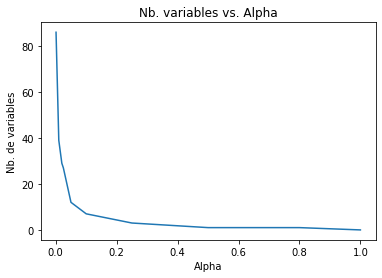

In [664]:
plt.plot(alpha_for_path,nbNonZero) 
plt.xlabel('Alpha')
plt.ylabel('Nb. de variables') 
plt.title('Nb. variables vs. Alpha') 
plt.show()

In [667]:
#nom des variables
nom_var = df_cluster1.columns[:143]
#coefficients pour alpha=0.1 (colonne n°4)
coefs25 = coefs_lasso[:,4]
#affichage de coefficients pour alpha = 0.25
print(pd.DataFrame({'Variables':nom_var,'Coefficients':coefs25}))

                  Variables  Coefficients
0                     Votes          -0.0
1      Democrats 08 (Votes)          -0.0
2      Democrats 12 (Votes)          -0.0
3    Republicans 08 (Votes)          -0.0
4    Republicans 12 (Votes)          -0.0
..                      ...           ...
138            Other08 Frac           0.0
139             Rep12 Frac2           0.0
140             Rep08 Frac2           0.0
141             Dem12 Frac2          -0.0
142             Dem08 Frac2          -0.0

[143 rows x 2 columns]


In [668]:
df01 = pd.DataFrame({'Variables':nom_var,'Coefficients':coefs25})
df01 = df01[abs(df01['Coefficients'])> 1e-10]
df01

,Variables,Coefficients
7,Republicans 2012,0.009924
9,Democrats 2012,-0.649282
13,At Least Bachelors's Degree,-0.076266
17,White (Not Latino) Population,0.076320
18,African American Population,-0.157353
36,White,0.002951
98,Votes16 Clintonh,-0.116774


On refait le même travail désormais pour le cluster 3 

In [669]:
#On crée le dataframe sur lequel on réalise le lasso
dfstd = pd.DataFrame(proc.StandardScaler().fit_transform(df_num))
dfstd = dfstd.fillna(0)
dfstd.columns = num_col[2:]
dfstd2 = pd.DataFrame(proc.StandardScaler().fit_transform(df_num))
dfstd2 = dfstd.fillna(0)
dfstd2.columns = num_col[2:]
cluster_centers, distortion = kmeans(dfstd,4)
cluster_labels = vq(dfstd,cluster_centers)[0]
dfstd['cluster_labels'], distortion_list = vq(dfstd,cluster_centers)[0] ,vq(dfstd,cluster_centers)[1]



#On supprime d'abord les variables résultats de 2016
del(dfstd['Republicans 2016'])
del(dfstd['Democrats 2016'])
del(dfstd['Rep16 Frac2'])
del(dfstd['Dem16 Frac2'])
dfstd['Rep16 Frac2'] = dfstd2['Rep16 Frac2']


df_cluster3 = dfstd[dfstd['cluster_labels']==3]
#On retire la colonne cluster_labels
del(df_cluster3['cluster_labels'])
df_cluster3

,Votes,Democrats 08 (Votes),Democrats 12 (Votes),Republicans 08 (Votes),Republicans 12 (Votes),Green 2016,Libertarians 2016,Republicans 2012,Republicans 2008,Democrats 2012,...,total12,other08,other12,Other12 Frac,Other08 Frac,Rep12 Frac2,Rep08 Frac2,Dem12 Frac2,Dem08 Frac2,Rep16 Frac2
0,0.608965,0.000747,-0.017480,1.138648,1.272754,0.000000,0.894683,1.233921,1.310700,-1.237066,...,0.485647,0.296156,0.496340,0.056722,-0.500409,1.239140,1.288819,-1.239140,-1.288819,0.588212
1,0.311704,0.408783,0.313885,0.221667,0.253666,0.575388,0.624178,-1.291823,-1.604177,1.341517,...,0.297180,0.383414,0.053943,-0.814138,-0.114858,-1.315149,-1.609275,1.315149,1.609275,-1.068484
3,-0.204701,-0.205443,-0.220301,-0.159267,-0.144678,-0.468346,-0.648846,0.841693,0.516239,-0.814454,...,-0.198967,-0.130437,-0.197556,-0.439257,0.251206,0.823526,0.526813,-0.823526,-0.526813,0.879897
5,-0.339695,-0.277673,-0.274381,-0.378470,-0.383627,-0.112395,0.903043,0.961220,0.997018,-0.959377,...,-0.326426,-0.292564,-0.285863,-0.025639,-0.069566,0.961913,0.995076,-0.961913,-0.995076,0.954821
10,-0.125869,-0.086744,-0.088887,-0.111673,-0.128888,0.345429,0.861103,-0.836976,-0.727825,0.775971,...,-0.104994,-0.005476,0.034897,0.988519,0.318618,-0.809183,-0.719780,0.809183,0.719780,-0.278334
12,0.029547,-0.019389,-0.025308,0.048789,0.056258,1.907040,2.208522,-0.559562,-0.552804,0.431877,...,0.013023,0.401727,0.382495,2.074375,1.671896,-0.492586,-0.501472,0.492586,0.501472,-0.741314
15,-0.292960,-0.238142,-0.239190,-0.330964,-0.325515,-0.717904,0.121931,-0.096025,-0.358546,0.088882,...,-0.280952,-0.253783,-0.239112,0.115753,-0.227765,-0.092082,-0.366763,0.092082,0.366763,0.348522
17,-0.362198,-0.286101,-0.282250,-0.415854,-0.424230,0.000000,-0.460503,0.864797,0.930458,-0.859576,...,-0.347334,-0.313032,-0.305342,-0.081022,-0.138147,0.862799,0.925462,-0.862799,-0.925462,0.905619
18,-0.181757,-0.206104,-0.208203,-0.136952,-0.143070,-0.160865,-0.155895,0.604352,0.664065,-0.593463,...,-0.190158,-0.140133,-0.171151,-0.174391,0.042266,0.598002,0.666484,-0.598002,-0.666484,0.647030
19,-0.280650,-0.236443,-0.236496,-0.305462,-0.309122,0.342741,1.700823,-0.011794,-0.042870,-0.067033,...,-0.271929,-0.196150,-0.186302,1.282125,0.811392,0.036539,-0.014348,-0.036539,0.014348,0.388580


(200, 144)
(1226, 144)
2726    0.669589
441    -0.165363
797     0.738848
1534    1.214153
903     0.753850
          ...   
2641    0.485656
929     0.156557
3102   -1.199348
862     1.056838
1733   -0.625140
Name: Rep16 Frac2, Length: 200, dtype: float64


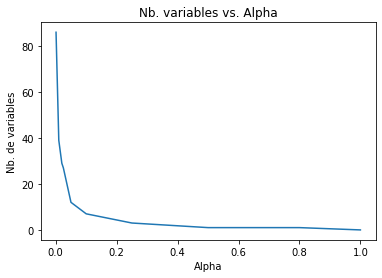

   alpha  Nb non-zero coefs
0  1.000                  0
1  0.800                  1
2  0.500                  1
3  0.250                  3
4  0.100                  7
5  0.050                 15
6  0.025                 26
7  0.020                 31
8  0.010                 43
9  0.001                 81
                  Variables  Coefficients
0                     Votes -0.000000e+00
1      Democrats 08 (Votes) -0.000000e+00
2      Democrats 12 (Votes) -0.000000e+00
3    Republicans 08 (Votes) -0.000000e+00
4    Republicans 12 (Votes) -0.000000e+00
..                      ...           ...
138            Other08 Frac  0.000000e+00
139             Rep12 Frac2  7.373505e-01
140             Rep08 Frac2  0.000000e+00
141             Dem12 Frac2 -4.112621e-13
142             Dem08 Frac2 -0.000000e+00

[143 rows x 2 columns]


In [670]:
#subdivision
from sklearn.model_selection import train_test_split
bbTrain, bbTest = train_test_split(df_cluster3,train_size = 200,random_state=69780)
#vérifications
print(bbTrain.shape) 
print(bbTest.shape) 


#matrice des descripteurs pour échantillon test
XTest = bbTest.iloc[:,:143]
X1Test = sm.add_constant(XTest)
#appliquer le modèle
ypReg = reg.predict(resReg.params,X1Test) 
#print(ypReg)
#vecteur cible
yTrain = bbTrain.iloc[:,143]
print(yTrain)
#centrer et réduire les données d'apprentissage
from sklearn.preprocessing import StandardScaler 
sc = StandardScaler()
ZTrain =sc.fit_transform(bbTrain)

from sklearn.linear_model import Lasso
regLasso1 = Lasso(fit_intercept=False,normalize=False)
#print(regLasso1)

#apprentissage
regLasso1.fit(ZTrain[:,:143],ZTrain[:,143])
#les coefficients
#print(regLasso1.coef_)
#lasso path (10 valeurs de alpha à tester)
my_alphas = numpy.array([0.001,0.01,0.02,0.025,0.05,0.1,0.25,0.5,0.8,1.0])

#obtention des valeurs des coefs. corresp.
from sklearn.linear_model import lasso_path
alpha_for_path, coefs_lasso, _ = lasso_path(ZTrain[:,:143],ZTrain[:,143],alphas=my_alphas)
plt.plot(alpha_for_path,nbNonZero) 
plt.xlabel('Alpha')
plt.ylabel('Nb. de variables') 
plt.title('Nb. variables vs. Alpha') 
plt.show()

#nombre de coefs. non-nuls pour chaque alpha
nbNonZero = numpy.apply_along_axis(func1d=numpy.count_nonzero,arr=coefs_lasso,axis=0)
print(pd.DataFrame({'alpha':alpha_for_path,'Nb non-zero coefs':nbNonZero}))

#nom des variables
nom_var = df_cluster3.columns[:143]
#coefficients pour alpha=0.1 (colonne n°3)
coefs25 = coefs_lasso[:,4]
#affichage de coefficients pour alpha = 0.25
print(pd.DataFrame({'Variables':nom_var,'Coefficients':coefs25}))

In [671]:
df01 = pd.DataFrame({'Variables':nom_var,'Coefficients':coefs25})
df01 = df01[abs(df01['Coefficients'])> 1e-10]
df01

,Variables,Coefficients
5,Green 2016,-0.000231
13,At Least Bachelors's Degree,-0.066058
14,Graduate Degree,-0.155647
43,Sire Homogeneity,0.078543
98,Votes16 Clintonh,-0.012860
139,Rep12 Frac2,0.737350


# Conclusion:

Nous avons au final trouvé des counties bien que similaire d'un point de vue résultats, qui sont assez différents par leur LASSO .
Les résultats aux élections de 2012 reste tout de même l'indicateur le plus performant.

In [675]:
#On crée le dataframe sur lequel on réalise le lasso
# NB: Il s'agit des counties du cluster 1
dfstd = pd.DataFrame(proc.StandardScaler().fit_transform(df_num))
dfstd = dfstd.fillna(0)
dfstd.columns = num_col[2:]
dfstd2 = pd.DataFrame(proc.StandardScaler().fit_transform(df_num))
dfstd2 = dfstd.fillna(0)
dfstd2.columns = num_col[2:]
cluster_centers, distortion = kmeans(dfstd,4)
cluster_labels = vq(dfstd,cluster_centers)[0]
dfstd['cluster_labels'], distortion_list = vq(dfstd,cluster_centers)[0] ,vq(dfstd,cluster_centers)[1]



#On supprime d'abord les variables résultats de 2016
del(dfstd['Republicans 2016'])
del(dfstd['Democrats 2016'])
del(dfstd['Rep16 Frac2'])
del(dfstd['Dem16 Frac2'])
dfstd['Rep16 Frac2'] = dfstd2['Rep16 Frac2']


df_cluster0 = dfstd[dfstd['cluster_labels']==0]
df_cluster1 = dfstd[dfstd['cluster_labels']==1]
df_cluster2 = dfstd[dfstd['cluster_labels']==2]
df_cluster3 = dfstd[dfstd['cluster_labels']==3]
#On retire la colonne cluster_labels
del(df_cluster0['cluster_labels'])
del(df_cluster1['cluster_labels'])
del(df_cluster2['cluster_labels'])
del(df_cluster3['cluster_labels'])
print(df_cluster0.shape ,df_cluster1.shape,df_cluster2.shape,df_cluster3.shape )


(384, 144) (210, 144) (1122, 144) (1427, 144)


Je crée ensuite les échantillons de test et d'apprentissage pour chaque cluster en fonction de sa taille.
Je fais le lasso pour le cluster 0.

# Cluster 0:

In [676]:
#subdivision
from sklearn.model_selection import train_test_split
bbTrain, bbTest = train_test_split(df_cluster0,train_size = 200,random_state=69780)
#vérifications
print(bbTrain.shape) 
print(bbTest.shape) 

(200, 144)
(184, 144)


(150, 143)
   alpha  Nb non-zero coefs
0  1.000                  0
1  0.800                  1
2  0.500                  1
3  0.250                  3
4  0.100                  9
5  0.050                 16
6  0.025                 26
7  0.020                 27
8  0.010                 35
9  0.001                 83


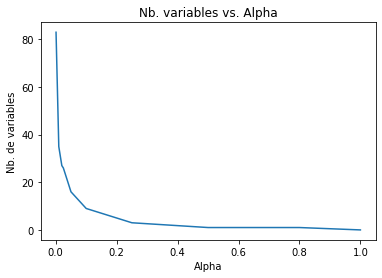

In [688]:
#matrice des explicatives
XTrain = bbTrain.iloc[:,:143]
print(XTrain.shape)
#à laquelle est ajoutée (accolée) la constante 1
import statsmodels.api as sm 
X1Train = sm.add_constant(XTrain)
#vérification
#print(X1Train.head())

#vecteur cible
yTrain = bbTrain.iloc[:,143]

#centrer et réduire les données d'apprentissage
from sklearn.preprocessing import StandardScaler 
sc = StandardScaler()
ZTrain =sc.fit_transform(bbTrain)

from sklearn.linear_model import Lasso
regLasso1 = Lasso(fit_intercept=False,normalize=False)
#print(regLasso1)

#apprentissage
regLasso1.fit(ZTrain[:,:143],ZTrain[:,143])
#les coefficients
#print(regLasso1.coef_)

#lasso path (10 valeurs de alpha à tester)
my_alphas = numpy.array([0.001,0.01,0.02,0.025,0.05,0.1,0.25,0.5,0.8,1.0])

#obtention des valeurs des coefs. corresp.
from sklearn.linear_model import lasso_path
alpha_for_path, coefs_lasso, _ = lasso_path(ZTrain[:,:143],ZTrain[:,143],alphas=my_alphas)

#nombre de coefs. non-nuls pour chaque alpha
nbNonZero = numpy.apply_along_axis(func1d=numpy.count_nonzero,arr=coefs_lasso,axis=0)
print(pd.DataFrame({'alpha':alpha_for_path,'Nb non-zero coefs':nbNonZero}))

plt.plot(alpha_for_path,nbNonZero) 
plt.xlabel('Alpha')
plt.ylabel('Nb. de variables') 
plt.title('Nb. variables vs. Alpha') 
plt.show()

In [689]:
#nom des variables
nom_var = df_cluster0.columns[:143]
#coefficients pour alpha=0.1 (colonne n°4)
coefs10 = coefs_lasso[:,4]
#affichage de coefficients pour alpha = 0.25
print(pd.DataFrame({'Variables':nom_var,'Coefficients':coefs10}))
df01 = pd.DataFrame({'Variables':nom_var,'Coefficients':coefs10})
df01 = df01[abs(df01['Coefficients'])> 1e-10]
df01

                  Variables  Coefficients
0                     Votes -0.000000e+00
1      Democrats 08 (Votes) -0.000000e+00
2      Democrats 12 (Votes) -0.000000e+00
3    Republicans 08 (Votes) -0.000000e+00
4    Republicans 12 (Votes) -0.000000e+00
..                      ...           ...
138            Other08 Frac -0.000000e+00
139             Rep12 Frac2  0.000000e+00
140             Rep08 Frac2  4.198436e-03
141             Dem12 Frac2 -0.000000e+00
142             Dem08 Frac2 -2.936910e-14

[143 rows x 2 columns]


,Variables,Coefficients
7,Republicans 2012,0.260878
10,Democrats 2008,-0.531754
13,At Least Bachelors's Degree,-0.043048
43,Sire Homogeneity,0.007343
44,Median Age,0.029329
52,Adult.smoking,0.046417
65,MAR,-0.063260
140,Rep08 Frac2,0.004198


On réitère pour le cluster 1,2 et 3.

# Cluster 1:

In [690]:
#subdivision
from sklearn.model_selection import train_test_split
bbTrain, bbTest = train_test_split(df_cluster1,train_size = 150,random_state=69780)
#vérifications
print(bbTrain.shape) 
print(bbTest.shape) 

(150, 144)
(60, 144)


(150, 143)
   alpha  Nb non-zero coefs
0  1.000                  0
1  0.800                  1
2  0.500                  1
3  0.250                  3
4  0.100                  9
5  0.050                 16
6  0.025                 26
7  0.020                 27
8  0.010                 35
9  0.001                 83


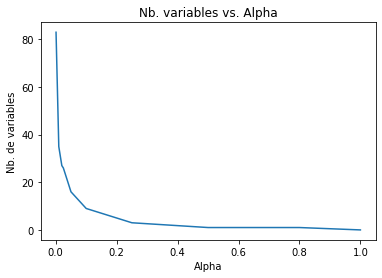

                  Variables  Coefficients
0                     Votes -0.000000e+00
1      Democrats 08 (Votes) -0.000000e+00
2      Democrats 12 (Votes) -0.000000e+00
3    Republicans 08 (Votes) -0.000000e+00
4    Republicans 12 (Votes) -0.000000e+00
..                      ...           ...
138            Other08 Frac -0.000000e+00
139             Rep12 Frac2  0.000000e+00
140             Rep08 Frac2  4.198436e-03
141             Dem12 Frac2 -0.000000e+00
142             Dem08 Frac2 -2.936910e-14

[143 rows x 2 columns]


,Variables,Coefficients
7,Republicans 2012,0.260878
10,Democrats 2008,-0.531754
13,At Least Bachelors's Degree,-0.043048
43,Sire Homogeneity,0.007343
44,Median Age,0.029329
52,Adult.smoking,0.046417
65,MAR,-0.063260
140,Rep08 Frac2,0.004198


In [691]:
#matrice des explicatives
XTrain = bbTrain.iloc[:,:143]
print(XTrain.shape)
#à laquelle est ajoutée (accolée) la constante 1
import statsmodels.api as sm 
X1Train = sm.add_constant(XTrain)
#vérification
#print(X1Train.head())

#vecteur cible
yTrain = bbTrain.iloc[:,143]

#centrer et réduire les données d'apprentissage
from sklearn.preprocessing import StandardScaler 
sc = StandardScaler()
ZTrain =sc.fit_transform(bbTrain)

from sklearn.linear_model import Lasso
regLasso1 = Lasso(fit_intercept=False,normalize=False)
#print(regLasso1)

#apprentissage
regLasso1.fit(ZTrain[:,:143],ZTrain[:,143])
#les coefficients
#print(regLasso1.coef_)

#lasso path (10 valeurs de alpha à tester)
my_alphas = numpy.array([0.001,0.01,0.02,0.025,0.05,0.1,0.25,0.5,0.8,1.0])

#obtention des valeurs des coefs. corresp.
from sklearn.linear_model import lasso_path
alpha_for_path, coefs_lasso, _ = lasso_path(ZTrain[:,:143],ZTrain[:,143],alphas=my_alphas)

#nombre de coefs. non-nuls pour chaque alpha
nbNonZero = numpy.apply_along_axis(func1d=numpy.count_nonzero,arr=coefs_lasso,axis=0)
print(pd.DataFrame({'alpha':alpha_for_path,'Nb non-zero coefs':nbNonZero}))

plt.plot(alpha_for_path,nbNonZero) 
plt.xlabel('Alpha')
plt.ylabel('Nb. de variables') 
plt.title('Nb. variables vs. Alpha') 
plt.show()

#nom des variables
nom_var = df_cluster1.columns[:143]
#coefficients pour alpha=0.1 (colonne n°4)
coefs10 = coefs_lasso[:,4]
#affichage de coefficients pour alpha = 0.25
print(pd.DataFrame({'Variables':nom_var,'Coefficients':coefs10}))
df01 = pd.DataFrame({'Variables':nom_var,'Coefficients':coefs10})
df01 = df01[abs(df01['Coefficients'])> 1e-10]
df01

# Cluster 2

In [693]:
#subdivision
from sklearn.model_selection import train_test_split
bbTrain, bbTest = train_test_split(df_cluster2,train_size = 800,random_state=69780)
#vérifications
print(bbTrain.shape) 
print(bbTest.shape) 

(800, 144)
(322, 144)


(800, 143)
   alpha  Nb non-zero coefs
0  1.000                  0
1  0.800                  1
2  0.500                  1
3  0.250                  7
4  0.100                  8
5  0.050                 14
6  0.025                 25
7  0.020                 25
8  0.010                 39
9  0.001                 89


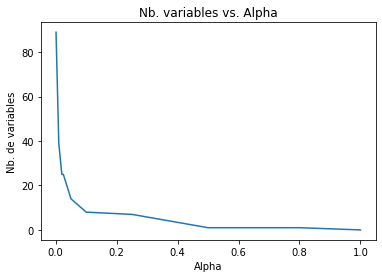

                  Variables  Coefficients
0                     Votes          -0.0
1      Democrats 08 (Votes)          -0.0
2      Democrats 12 (Votes)          -0.0
3    Republicans 08 (Votes)          -0.0
4    Republicans 12 (Votes)          -0.0
..                      ...           ...
138            Other08 Frac          -0.0
139             Rep12 Frac2           0.0
140             Rep08 Frac2           0.0
141             Dem12 Frac2          -0.0
142             Dem08 Frac2          -0.0

[143 rows x 2 columns]


,Variables,Coefficients
7,Republicans 2012,0.051879
9,Democrats 2012,-0.648659
13,At Least Bachelors's Degree,-0.094148
17,White (Not Latino) Population,0.136753
18,African American Population,-0.083118
20,Asian American Population,-0.049126
36,White,0.002478
98,Votes16 Clintonh,-0.069664


In [695]:


#matrice des explicatives
XTrain = bbTrain.iloc[:,:143]
print(XTrain.shape)
#à laquelle est ajoutée (accolée) la constante 1
import statsmodels.api as sm 
X1Train = sm.add_constant(XTrain)
#vérification
#print(X1Train.head())

#vecteur cible
yTrain = bbTrain.iloc[:,143]

#centrer et réduire les données d'apprentissage
from sklearn.preprocessing import StandardScaler 
sc = StandardScaler()
ZTrain =sc.fit_transform(bbTrain)

from sklearn.linear_model import Lasso
regLasso1 = Lasso(fit_intercept=False,normalize=False)
#print(regLasso1)

#apprentissage
regLasso1.fit(ZTrain[:,:143],ZTrain[:,143])
#les coefficients
#print(regLasso1.coef_)

#lasso path (10 valeurs de alpha à tester)
my_alphas = numpy.array([0.001,0.01,0.02,0.025,0.05,0.1,0.25,0.5,0.8,1.0])

#obtention des valeurs des coefs. corresp.
from sklearn.linear_model import lasso_path
alpha_for_path, coefs_lasso, _ = lasso_path(ZTrain[:,:143],ZTrain[:,143],alphas=my_alphas)

#nombre de coefs. non-nuls pour chaque alpha
nbNonZero = numpy.apply_along_axis(func1d=numpy.count_nonzero,arr=coefs_lasso,axis=0)
print(pd.DataFrame({'alpha':alpha_for_path,'Nb non-zero coefs':nbNonZero}))

plt.plot(alpha_for_path,nbNonZero) 
plt.xlabel('Alpha')
plt.ylabel('Nb. de variables') 
plt.title('Nb. variables vs. Alpha') 
plt.show()

#nom des variables
nom_var = df_cluster2.columns[:143]
#coefficients pour alpha=0.1 (colonne n°4)
coefs10 = coefs_lasso[:,4]
#affichage de coefficients pour alpha = 0.25
print(pd.DataFrame({'Variables':nom_var,'Coefficients':coefs10}))
df01 = pd.DataFrame({'Variables':nom_var,'Coefficients':coefs10})
df01 = df01[abs(df01['Coefficients'])> 1e-10]
df01

# Cluster 3

In [699]:
#subdivision
from sklearn.model_selection import train_test_split
bbTrain, bbTest = train_test_split(df_cluster3,train_size = 900,random_state=69780)
#vérifications
print(bbTrain.shape) 
print(bbTest.shape) 

(900, 144)
(527, 144)


(900, 143)
   alpha  Nb non-zero coefs
0  1.000                  0
1  0.800                  1
2  0.500                  2
3  0.250                  4
4  0.100                  7
5  0.050                 12
6  0.025                 24
7  0.020                 26
8  0.010                 37
9  0.001                 89


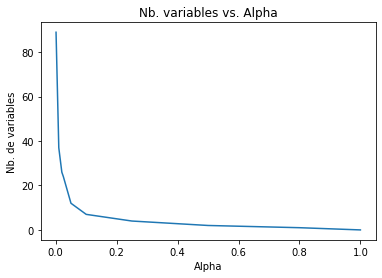

                  Variables  Coefficients
0                     Votes     -0.000000
1      Democrats 08 (Votes)     -0.000000
2      Democrats 12 (Votes)     -0.000000
3    Republicans 08 (Votes)     -0.000000
4    Republicans 12 (Votes)     -0.000000
..                      ...           ...
138            Other08 Frac      0.000000
139             Rep12 Frac2      0.717204
140             Rep08 Frac2      0.000000
141             Dem12 Frac2     -0.000581
142             Dem08 Frac2     -0.000000

[143 rows x 2 columns]


,Variables,Coefficients
5,Green 2016,-0.023507
13,At Least Bachelors's Degree,-0.143303
14,Graduate Degree,-0.088221
43,Sire Homogeneity,0.042233
98,Votes16 Clintonh,-0.030262
139,Rep12 Frac2,0.717204
141,Dem12 Frac2,-0.000581


In [700]:


#matrice des explicatives
XTrain = bbTrain.iloc[:,:143]
print(XTrain.shape)
#à laquelle est ajoutée (accolée) la constante 1
import statsmodels.api as sm 
X1Train = sm.add_constant(XTrain)
#vérification
#print(X1Train.head())

#vecteur cible
yTrain = bbTrain.iloc[:,143]

#centrer et réduire les données d'apprentissage
from sklearn.preprocessing import StandardScaler 
sc = StandardScaler()
ZTrain =sc.fit_transform(bbTrain)

from sklearn.linear_model import Lasso
regLasso1 = Lasso(fit_intercept=False,normalize=False)
#print(regLasso1)

#apprentissage
regLasso1.fit(ZTrain[:,:143],ZTrain[:,143])
#les coefficients
#print(regLasso1.coef_)

#lasso path (10 valeurs de alpha à tester)
my_alphas = numpy.array([0.001,0.01,0.02,0.025,0.05,0.1,0.25,0.5,0.8,1.0])

#obtention des valeurs des coefs. corresp.
from sklearn.linear_model import lasso_path
alpha_for_path, coefs_lasso, _ = lasso_path(ZTrain[:,:143],ZTrain[:,143],alphas=my_alphas)

#nombre de coefs. non-nuls pour chaque alpha
nbNonZero = numpy.apply_along_axis(func1d=numpy.count_nonzero,arr=coefs_lasso,axis=0)
print(pd.DataFrame({'alpha':alpha_for_path,'Nb non-zero coefs':nbNonZero}))

plt.plot(alpha_for_path,nbNonZero) 
plt.xlabel('Alpha')
plt.ylabel('Nb. de variables') 
plt.title('Nb. variables vs. Alpha') 
plt.show()

#nom des variables
nom_var = df_cluster3.columns[:143]
#coefficients pour alpha=0.1 (colonne n°4)
coefs10 = coefs_lasso[:,4]
#affichage de coefficients pour alpha = 0.25
print(pd.DataFrame({'Variables':nom_var,'Coefficients':coefs10}))
df01 = pd.DataFrame({'Variables':nom_var,'Coefficients':coefs10})
df01 = df01[abs(df01['Coefficients'])> 1e-10]
df01

# Conclusion:

Nous avons au final trouvé des counties bien que similaire d'un point de vue résultats, qui sont assez différents par leur LASSO .
Les résultats aux élections de 2012 reste tout de même l'indicateur le plus performant.